In [7]:
#!pip install compressai
#!git clone https://github.com/InterDigitalInc/CompressAI compressai

"with torch.no_grad():\n    out_net = net_codec.forward(env.dataset_torch / 255.)\n    #out_net = net.forward(x)\nout_net['x_hat'].clamp_(0, 1)\nprint(out_net.keys())"

In [3]:
exec(open('main.py').read())
import compressai
import math
from compressai.zoo import bmshj2018_factorized, cheng2020_attn, mbt2018,ssf2020
import torch
from PIL import Image
import torchvision.transforms
import torch
import skvideo.io
from PIL import Image
import numpy as np
from CNNfeatures import get_features
from VQAmodel import VQAModel
from argparse import ArgumentParser
import time
from PIL import Image
import torch
import numpy as np
from torch import nn
import torch.optim as optim
device = 'cuda' if torch.cuda.is_available() else 'cpu'
net_enhance = None

In [4]:
def convrelu(in_channels, out_channels, kernel, padding):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel, padding=padding),
        nn.ReLU(inplace=True),
    )


class ResNetUNet(nn.Module):
    def __init__(self, n_class):
        super().__init__()

        self.base_model = torchvision.models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.layer0 = nn.Sequential(*self.base_layers[:3]) # size=(N, 64, x.H/2, x.W/2)
        self.layer0_1x1 = convrelu(64, 64, 1, 0)
        self.layer1 = nn.Sequential(*self.base_layers[3:5]) # size=(N, 64, x.H/4, x.W/4)
        self.layer1_1x1 = convrelu(64, 64, 1, 0)
        self.layer2 = self.base_layers[5]  # size=(N, 128, x.H/8, x.W/8)
        self.layer2_1x1 = convrelu(128, 128, 1, 0)
        self.layer3 = self.base_layers[6]  # size=(N, 256, x.H/16, x.W/16)
        self.layer3_1x1 = convrelu(256, 256, 1, 0)
        self.layer4 = self.base_layers[7]  # size=(N, 512, x.H/32, x.W/32)
        self.layer4_1x1 = convrelu(512, 512, 1, 0)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv_up3 = convrelu(256 + 512, 512, 3, 1)
        self.conv_up2 = convrelu(128 + 512, 256, 3, 1)
        self.conv_up1 = convrelu(64 + 256, 256, 3, 1)
        self.conv_up0 = convrelu(64 + 256, 128, 3, 1)

        self.conv_original_size0 = convrelu(3, 64, 3, 1)
        self.conv_original_size1 = convrelu(64, 64, 3, 1)
        self.conv_original_size2 = convrelu(64 + 128, 64, 3, 1)

        self.conv_last = nn.Conv2d(64, n_class, 1)

    def forward(self, input):
        x_original = self.conv_original_size0(input)
        x_original = self.conv_original_size1(x_original)

        layer0 = self.layer0(input)
        layer1 = self.layer1(layer0)
        layer2 = self.layer2(layer1)
        layer3 = self.layer3(layer2)
        layer4 = self.layer4(layer3)

        layer4 = self.layer4_1x1(layer4)
        x = self.upsample(layer4)
        layer3 = self.layer3_1x1(layer3)
        x = torch.cat([x, layer3], dim=1)
        x = self.conv_up3(x)

        x = self.upsample(x)
        layer2 = self.layer2_1x1(layer2)
        x = torch.cat([x, layer2], dim=1)
        x = self.conv_up2(x)

        x = self.upsample(x)
        layer1 = self.layer1_1x1(layer1)
        x = torch.cat([x, layer1], dim=1)
        x = self.conv_up1(x)

        x = self.upsample(x)
        layer0 = self.layer0_1x1(layer0)
        x = torch.cat([x, layer0], dim=1)
        x = self.conv_up0(x)

        x = self.upsample(x)
        x = torch.cat([x, x_original], dim=1)
        x = self.conv_original_size2(x)

        out = self.conv_last(x)

        return out
    

net_enhance = ResNetUNet(3).to(device)

In [3]:
from piq import LPIPS as piq_LPIPS
from piq import DISTS as piq_DISTS
import IQA_pytorch as iqa#SSIM, GMSD, LPIPSvgg, DISTS
lpips = iqa.LPIPSvgg().to(device)
dists = iqa.DISTS().to(device)
#pq_lpips = piq_LPIPS().to(device)
#pq_dists = piq_DISTS().to(device)

#pdists_val = pq_dists(X_out["x_hat"],X)
#idists_val = dists(X_out["x_hat"],X)
#ilpips_val = lpips(X_out["x_hat"],X)
#plpips_val = pq_lpips(X_out["x_hat"],X)
#all -- losses

In [5]:
#nn codec
#EXEC

save_filename = "vimeo11k_model_vimeo9k_DISTS_MDTVSFA_LPIPS_enhance"



#net_codec = bmshj2018_factorized(quality=2, pretrained=True).train().to(device)
#mbt2018
net_codec = cheng2020_attn(quality=2, pretrained=True).train().to(device)# ssf2020 -- video
env = calc_met( model = "MDTVSFA", home_dir1=home_dir,dataset_dir=dst_dir)
#env.datagen = [frameGT for frameGT in skvideo.io.FFmpegReader(env.dataset_dir + env.dataset[0], outputdict={"-c:v" :" rawvideo","-f": "rawvideo"}).nextFrame()]
self = env
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


from piq import LPIPS as piq_LPIPS#PieAPP VSI, FSIM, NLPD, deepIQA
from piq import DISTS as piq_DISTS
import IQA_pytorch as iqa#SSIM, GMSD, LPIPSvgg, DISTS
if 0:
    lpips = iqa.LPIPSvgg().to(device)
    dists = iqa.DISTS().to(device)

def loss_calc(X_out, Y):
    if X_out['x_hat'].device != Y.device:
        X_out['x_hat'] = X_out['x_hat'].to(device)
    dist = metr.MDTVSFA(X_out['x_hat'])
    loss = rdLoss(X_out, Y)
    loss['MDTVSFA'] = -dist
    lmbda = 1e-2
    loss["loss"] = loss['MDTVSFA'] + loss["bpp_loss"] + lmbda / 2 * loss["mse_loss"] * 255 ** 2# * loss["mse"] + loss["bpp_loss"]
    loss["aux_loss"] = net_codec.aux_loss()
    return loss

class Video_reader_read():
    def __init__(self,name1 = dst_dir + "blue_hair_1920x1080_30.yuv.Y4M"):
        self.nameGT = name1
        
    def get_frame(self):
        self.temp_reader1 = skvideo.io.FFmpegReader(self.nameGT, outputdict={"-c:v" :" rawvideo","-f": "rawvideo"})
        self.datagenGT = [frameGT / 255. for frameGT in self.temp_reader1.nextFrame()]
        self.temp_reader1.close()
        self.datagenGT = np.array([[i[:,:,0],i[:,:,1],i[:,:,2]] for i in self.datagenGT])
        self.lst_1 = torch.tensor(self.datagenGT[0]).float() - 0.5
        return torch.stack([self.lst_1])
rd = Video_reader_read()
def pltimshow(arg):
    plt.imshow(arg.cpu().detach().numpy().swapaxes(1,3).swapaxes(1,2)[0])
class calc_met:
    def __init__(self,dataset1 = ["Run439.Y4M"], convKer1 = None, home_dir1 = "R:/", creat_dir = False, calc_SSIM_PSNR = False, calc_model_features = False, model = "vmaf_v063" , codec = '   -preset:v medium -x265-params log-level=error ',dataset_dir = "dataset/"):
        self.device = "cuda:0"
        self.model = VQAModel().to(device)
        self.model.load_state_dict(torch.load('../models/MDTVSFA.pt'))
        self.model.train()
        self.frame_batch_size = 1
        self.dataset_err = None
        self.dataset_err_torch = None
        self.dataset_np = None
        self.dataset_torch = None
        self.datagen = None
        self.features = None
        self.dataset = []
        self.crf_arr = []
        self.dataset_dir = dataset_dir
        self.calc_model_features = calc_model_features
        self.Results = []
        self.relative_score, self.mapped_score, self.aligned_score = 0,0,0
    def MDTVSFA(self, transformed_video):
        with torch.enable_grad():
            self.features = get_features(transformed_video, frame_batch_size=self.frame_batch_size, device=self.device)
            self.features = torch.unsqueeze(self.features, 0) 
            if len(self.features.shape) == 2:
                self.features = self.features.unsqueeze(0)
            input_length = self.features.shape[1] * torch.ones(1, 1, dtype=torch.long)
            self.relative_score, self.mapped_score, self.aligned_score = self.model.forward([(self.features, input_length, ['K'])])
            y_pred = self.mapped_score[0][0]#.to('cpu').detach().numpy()
        return y_pred
metr = calc_met()

def pltimshow_batch(args, filename = "vis/tmp.png"):
    plt.figure(dpi = 800)
    Ar2 = None
    for arg in args:
        Ar1 = np.concatenate([i for i in arg.cpu().detach().numpy().swapaxes(1,3).swapaxes(1,2)], 0)
        if Ar2 is None:
            Ar2 = Ar1
        else:
            Ar2 = np.concatenate([Ar2,Ar1],1)
    plt.imshow(Ar2)
    plt.axis('off')
    plt.savefig(filename, bbox_inches='tight')
#X_orig = cheng2020_attn(quality=2, pretrained=True)(X.cpu())
class RateDistortionLoss(nn.Module):
    """Custom rate distortion loss with a Lagrangian parameter."""
    def __init__(self, lmbda=1e-2):
        super().__init__()
        self.mse = nn.MSELoss()
        self.lmbda = lmbda

    def forward(self, output, target):
        N, _, H, W = target.size()
        out = {}
        num_pixels = N * H * W

        out["bpp_loss"] = sum(
            (torch.log(likelihoods).sum() / (-math.log(2) * num_pixels))
            for likelihoods in output["likelihoods"].values()
        )
        out["mse_loss"] = self.mse(output["x_hat"], target)
        out["loss_classic"] = self.lmbda * 255 ** 2 * out["mse_loss"] + out["bpp_loss"]
        return out
rdLoss = RateDistortionLoss()
from torch.utils.data import Dataset, IterableDataset
dst_dir_vimeo = 'P:/vimeo_triplet/sequences/'
from torchvision.io import read_image
from torch.utils.data import DataLoader
import os
import torchvision
def dir_of_dirs(paths):
    A = []
    for j in paths:
        for i in os.listdir(j):
            A.append(os.path.join(j, i))
    return A

class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None,train = True, datalen = 128):
        super(CustomImageDataset).__init__()
        self.datalen = datalen
        self.train = train
        self.image = 0
        self.label = 0
        self.img_names = dir_of_dirs(dir_of_dirs(dir_of_dirs([dst_dir_vimeo])))
        self.img_dir = img_dir
    def __len__(self):
        return self.datalen#9600#len(self.img_names)
    def __getitem__(self, idx):
        if not self.train:
            idx = len(self.img_names) - idx - 1
        img_path = self.img_names[idx]
        image = read_image(img_path)
        if len(image.shape) == 2 or image.shape[0] == 1:
            image = torch.cat([image for i in range(3)])
        self.image = image
        return torchvision.transforms.RandomResizedCrop((256,256))(self.image) / 255.
    
#dataset = CustomImageDataset(dst_dir_vimeo)#219k
#dataset_train = iter(DataLoader(dataset, batch_size= 16, shuffle = True))#13k

#dataset_train, dataset_test = torch.utils.data.random_split( dataset,[int(len(dataset)*0.9),len(dataset)-int(len(dataset)*0.9)])
dataset_train = CustomImageDataset(dst_dir_vimeo,train= True, datalen = 11000)
dataset_test = CustomImageDataset(dst_dir_vimeo,train= False, datalen = 400)
dataset_train = DataLoader(dataset_train, batch_size= 4, shuffle = True)#8
dataset_test = DataLoader(dataset_test, batch_size= 4, shuffle = True)#8

In [ ]:

X = rd.get_frame()
X = torchvision.transforms.RandomResizedCrop((256,256))(X)
mse_loss = nn.MSELoss()
#opt_target = [i for i in net_codec.parameters()]
opt_target = [p for n,p in net_codec.named_parameters()]
#optimizer = optim.Adam(opt_target, lr = 0.001)
dr_name = "v_mse"
AV_log = []
curve_mse = []
plot_data = []
plot_data_mse = []
from IPython.display import clear_output

parameters = set(p for n, p in net_enhance.named_parameters()) # set(p for n, p in net_codec.named_parameters() if not n.endswith(".quantiles"))
aux_parameters = set(p for n, p in net_codec.named_parameters() if n.endswith(".quantiles"))
aux_loss = net_codec.entropy_bottleneck.loss()
optimizer = optim.Adam(parameters, lr=1e-4)
aux_optimizer = optim.Adam(aux_parameters, lr=1e-3)
save_netcodec = True

save_result = True
X_sample = torch.load("sample_data/X.ckpt")

n = 30
rd = Video_reader_read()
logs_plot_cur = {}
logs_plot = {}
max_epoch = 12

for epoch in tqdm(range(max_epoch)):
    idx_video = 0
    logs_plot_cur = {}
    for to_train in [True, False]:
        tqdm_dataset = tqdm(dataset_train if to_train else dataset_test)
        for frame in tqdm_dataset:
            idx_video += 1
            X.data = frame.data 
            X = torchvision.transforms.RandomResizedCrop((256,256))(X)
            X = X.detach().to(device)
            Y = X.detach().clone().to(device)
            optimizer.zero_grad()
            aux_optimizer.zero_grad()
            X_enhance = net_enhance(X)
            X_out = net_codec.forward(X_enhance)
            loss = rdLoss(X_out, Y)
            lmbda = 1e-2
            #with torch.no_grad():
            loss['MDTVSFA'] = -metr.MDTVSFA(X_out['x_hat'])
            loss["LPIPS"] = lpips(X_out['x_hat'], X)
            loss["DISTS"] = dists(X_out['x_hat'], X)
            loss["loss"] =  loss["DISTS"] + loss["bpp_loss"] + loss["LPIPS"] + loss['MDTVSFA'] 
            
            if epoch != 0 and to_train:
                loss["loss"].backward()
                optimizer.step()
            loss["aux_loss"] = net_codec.aux_loss()
            #if epoch != 0 and to_train:
                #loss["aux_loss"].backward()
                #aux_optimizer.step()
                
            torch.nn.utils.clip_grad_norm_(opt_target, 1)
            #optimizer.step()
            
            for j in list(loss.keys()):
                j_converted = j + ("_test" if not to_train else "")
                if not j_converted in logs_plot_cur:
                    logs_plot_cur[j_converted] = []
                logs_plot_cur[j_converted].append(loss[j].data.to("cpu").numpy())
            
            X.data.clamp_(min=0,max=1)
            X_out['x_hat'].data.clamp_(min=0,max=1)
            torch.nn.utils.clip_grad_norm_(opt_target, 1)
            
    if not to_train:
        for j in list(logs_plot_cur.keys()):
            if not j in logs_plot:
                logs_plot[j] = []
            logs_plot[j].append(np.mean(logs_plot_cur[j]))
    if 1:
        clear_output()
        fig = plt.figure(figsize=(20,8))
        unique_names = list(np.unique(list(map(lambda x : x.split("_test")[0], list(logs_plot.keys())))))
        unique_idx = {i: j for i, j in zip(unique_names, range(len(unique_names)))}
        for plot_idx, plot_i in enumerate(list(logs_plot.keys())):
            short_name = plot_i.split("_test")[0]
            cur_idx = unique_idx[short_name]    
            plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
            plt.xlabel("step_number")
            plt.title("Learning curve " + short_name)
            plt.ylabel(short_name)
            plt.plot(np.arange(len(logs_plot[plot_i])), logs_plot[plot_i], label = ("train" if short_name == plot_i else "test"))    
            plt.legend()
            plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
            plt.tight_layout() 
        if save_result == True:
            fig.savefig("vis/lerningcurve" + save_filename + ".png")
            if save_netcodec == True:
                torch.save(net_codec.state_dict(), "models/model_" +save_filename + ".ckpt") 
            if net_enhance != None:
                torch.save(net_enhance.state_dict(), "models_enhancement/model_" +save_filename + ".ckpt") 
            import pickle
            with open('models/plots'+ save_filename + '.pkl', 'wb') as f:
                pickle.dump(logs_plot, f)
    
        tqdm_dataset.refresh()
        plt.show()
        plt.figure(25)
        #X.data = X_sample.data
        #X_out = net_codec.forward(X)
        pltimshow_batch([X, X_out['x_hat']], filename = "vis/pics_" + save_filename + ".png")
        plt.pause(0.005)

<ipython-input-7-3a2866c5a778>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-7-3a2866c5a778>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-7-3a2866c5a778>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuse

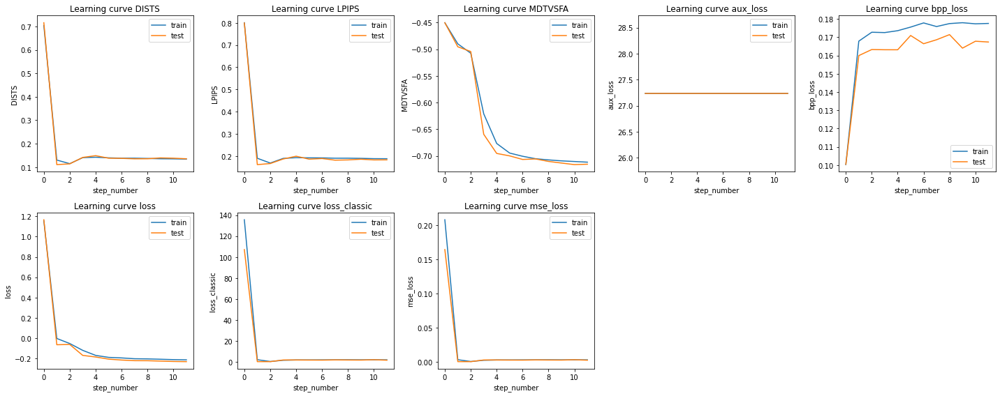

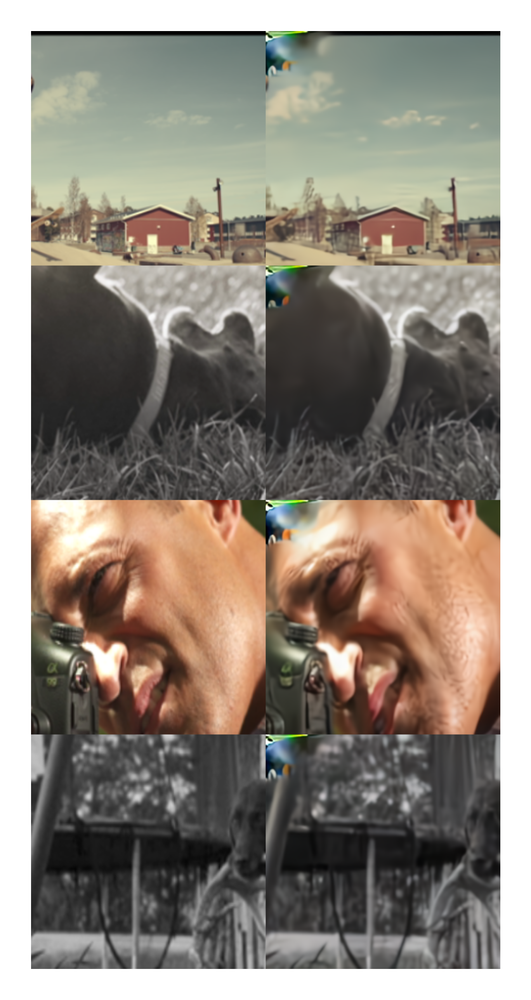

In [7]:
fig = plt.figure(figsize=(20,8))
unique_names = list(np.unique(list(map(lambda x : x.split("_test")[0], list(logs_plot.keys())))))
unique_idx = {i: j for i, j in zip(unique_names, range(len(unique_names)))}
for plot_idx, plot_i in enumerate(list(logs_plot.keys())):
    short_name = plot_i.split("_test")[0]
    cur_idx = unique_idx[short_name]    
    plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
    plt.xlabel("step_number")
    plt.title("Learning curve " + short_name)
    plt.ylabel(short_name)
    plt.plot(np.arange(len(logs_plot[plot_i])), logs_plot[plot_i], label = ("train" if short_name == plot_i else "test"))    
    plt.legend()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.tight_layout()
pltimshow_batch([X, X_out['x_hat']], filename = "vis/pics_" + save_filename + ".png")

In [5]:
from useful_tools import count_parameters

In [6]:
count_parameters(net_enhance)

+-----------+------------+
|  Modules  | Parameters |
+-----------+------------+
|  0.weight |    9408    |
|   0.bias  |     64     |
|  1.weight |   36864    |
|   1.bias  |     64     |
|  2.weight |   36864    |
|   2.bias  |     64     |
|  3.weight |   36864    |
|   3.bias  |     64     |
|  4.weight |   36864    |
|   4.bias  |     64     |
|  5.weight |   73728    |
|   5.bias  |    128     |
|  6.weight |   147456   |
|   6.bias  |    128     |
|  7.weight |   147456   |
|   7.bias  |    128     |
|  8.weight |   294912   |
|   8.bias  |    256     |
|  9.weight |   589824   |
|   9.bias  |    256     |
| 10.weight |  1179648   |
|  10.bias  |    512     |
| 11.weight |   13824    |
|  11.bias  |     3      |
+-----------+------------+
Total Trainable Params: 2605443


2605443

In [8]:
import torch.nn as nn
def get_simple_cnn():
    cnn_ench = nn.Sequential(nn.Conv2d(3,64,7,padding='same'),
                      nn.Conv2d(64,64,3,padding='same'),
                      nn.Conv2d(64,64,3,padding='same'),
                      nn.Conv2d(64,64,3,padding='same'),
                      nn.Conv2d(64,64,3,padding='same'),
                      
                      nn.Conv2d(64,128,3,padding='same'),
                      nn.Conv2d(128,128,3,padding='same'),
                      #nn.Conv2d(128,128,3,padding='same'),
                      #nn.Conv2d(128,128,3,padding='same'),
                      #nn.Conv2d(128,128,3,padding='same'),
                      #nn.Conv2d(128,128,3,padding='same'),
                      #nn.Conv2d(128,128,3,padding='same'),
                      nn.Conv2d(128,128,3,padding='same'),
                      
                      nn.Conv2d(128,256,3,padding='same'),
                      #nn.Conv2d(256,256,3,padding='same'),
                      #nn.Conv2d(256,256,3,padding='same'),
                      nn.Conv2d(256,256,3,padding='same'),
                      
                      nn.Conv2d(256,512,3,padding='same'),
                      #nn.Conv2d(512,512,3,padding='same'),
                      #nn.Conv2d(512,512,3,padding='same'),
                      #nn.Conv2d(512,512,3,padding='same'),
                      nn.Conv2d(512,3,3,padding='same'),)
    return cnn_ench
#net_enhance = net_enhance.to(device)

<ipython-input-5-1e4293bef46b>:237: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-5-1e4293bef46b>:237: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-5-1e4293bef46b>:237: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently

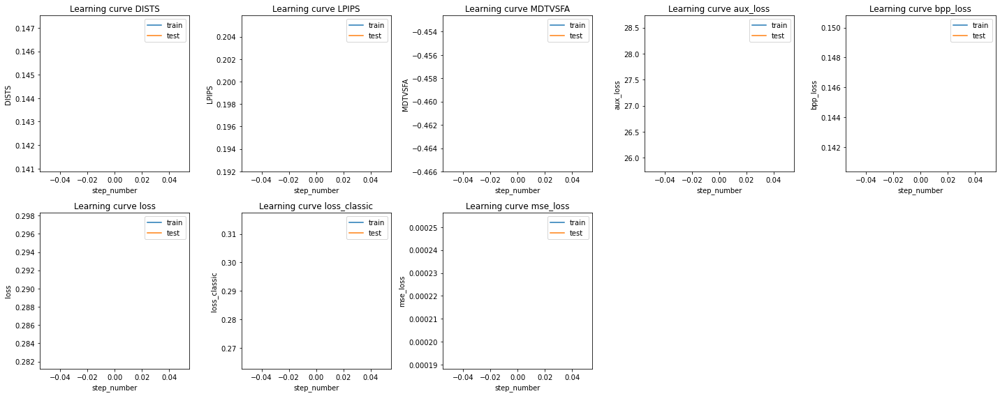

<Figure size 432x288 with 0 Axes>

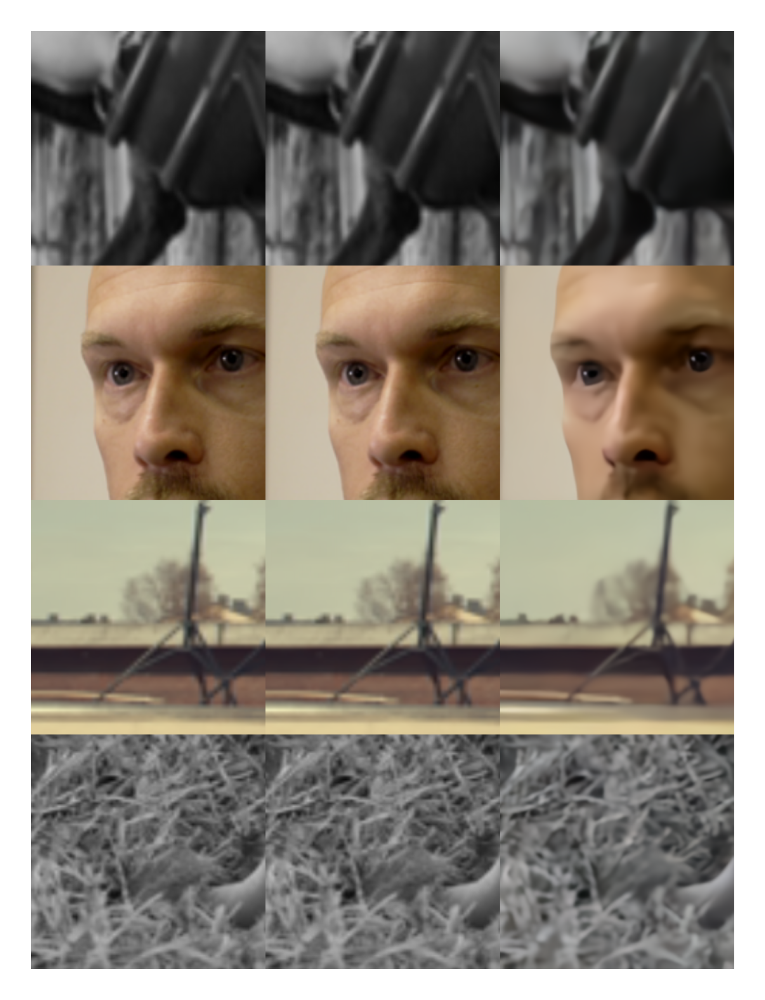

  0%|          | 0/2750 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [5]:
#nn codec
#EXEC

save_filename = "vimeo11k_original_model"


#net_codec = bmshj2018_factorized(quality=2, pretrained=True).train().to(device)
#mbt2018
net_codec = cheng2020_attn(quality=2, pretrained=True).train().to(device)# ssf2020 -- video
dst_dir = "../CVPR_results/dataset_CC_10/"
env = calc_met( model = "MDTVSFA", home_dir1=home_dir,dataset_dir=dst_dir)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
from piq import LPIPS as piq_LPIPS#PieAPP VSI, FSIM, NLPD, deepIQA
from piq import DISTS as piq_DISTS
import IQA_pytorch as iqa#SSIM, GMSD, LPIPSvgg, DISTS
lpips = iqa.LPIPSvgg().to(device)
dists = iqa.DISTS().to(device)

def loss_calc(X_out, Y):
    if X_out['x_hat'].device != Y.device:
        X_out['x_hat'] = X_out['x_hat'].to(device)
    dist = metr.MDTVSFA(X_out['x_hat'])
    loss = rdLoss(X_out, Y)
    loss['MDTVSFA'] = -dist
    lmbda = 1e-2
    loss["loss"] = loss['MDTVSFA'] + loss["bpp_loss"] + lmbda / 2 * loss["mse_loss"] * 255 ** 2# * loss["mse"] + loss["bpp_loss"]
    loss["aux_loss"] = net_codec.aux_loss()
    return loss

class Video_reader_read():
    def __init__(self,name1 = dst_dir + "blue_hair_1920x1080_30.yuv.Y4M"):
        self.nameGT = name1
        
    def get_frame(self):
        self.temp_reader1 = skvideo.io.FFmpegReader(self.nameGT, outputdict={"-c:v" :" rawvideo","-f": "rawvideo"})
        self.datagenGT = [frameGT / 255. for frameGT in self.temp_reader1.nextFrame()]
        self.temp_reader1.close()
        self.datagenGT = np.array([[i[:,:,0],i[:,:,1],i[:,:,2]] for i in self.datagenGT])
        self.lst_1 = torch.tensor(self.datagenGT[0]).float() - 0.5
        return torch.stack([self.lst_1])
rd = Video_reader_read()
def pltimshow(arg):
    plt.imshow(arg.cpu().detach().numpy().swapaxes(1,3).swapaxes(1,2)[0])
class calc_met:
    def __init__(self,dataset1 = ["Run439.Y4M"], convKer1 = None, home_dir1 = "R:/", creat_dir = False, calc_SSIM_PSNR = False, calc_model_features = False, model = "vmaf_v063" , codec = '   -preset:v medium -x265-params log-level=error ',dataset_dir = "dataset/"):
        self.device = "cuda:0"
        self.model = VQAModel().to(device)
        self.model.load_state_dict(torch.load('../models/MDTVSFA.pt'))
        self.model.train()
        self.frame_batch_size = 1
        self.dataset_err = None
        self.dataset_err_torch = None
        self.dataset_np = None
        self.dataset_torch = None
        self.datagen = None
        self.features = None
        self.dataset = []
        self.crf_arr = []
        self.dataset_dir = dataset_dir
        self.calc_model_features = calc_model_features
        self.Results = []
        self.relative_score, self.mapped_score, self.aligned_score = 0,0,0
    def MDTVSFA(self, transformed_video):
        with torch.enable_grad():
            self.features = get_features(transformed_video, frame_batch_size=self.frame_batch_size, device=self.device)
            self.features = torch.unsqueeze(self.features, 0) 
            if len(self.features.shape) == 2:
                self.features = self.features.unsqueeze(0)
            input_length = self.features.shape[1] * torch.ones(1, 1, dtype=torch.long)
            self.relative_score, self.mapped_score, self.aligned_score = self.model.forward([(self.features, input_length, ['K'])])
            y_pred = self.mapped_score[0][0]#.to('cpu').detach().numpy()
        return y_pred
metr = calc_met()

def pltimshow_batch(args, filename = "vis/tmp.png"):
    plt.figure(dpi = 800)
    Ar2 = None
    for arg in args:
        Ar1 = np.concatenate([i for i in arg.cpu().detach().numpy().swapaxes(1,3).swapaxes(1,2)], 0)
        if Ar2 is None:
            Ar2 = Ar1
        else:
            Ar2 = np.concatenate([Ar2,Ar1],1)
    plt.imshow(Ar2)
    plt.axis('off')
    plt.savefig(filename, bbox_inches='tight')
#X_orig = cheng2020_attn(quality=2, pretrained=True)(X.cpu())
class RateDistortionLoss(nn.Module):
    """Custom rate distortion loss with a Lagrangian parameter."""
    def __init__(self, lmbda=1e-2):
        super().__init__()
        self.mse = nn.MSELoss()
        self.lmbda = lmbda

    def forward(self, output, target):
        N, _, H, W = target.size()
        out = {}
        num_pixels = N * H * W

        out["bpp_loss"] = sum(
            (torch.log(likelihoods).sum() / (-math.log(2) * num_pixels))
            for likelihoods in output["likelihoods"].values()
        )
        out["mse_loss"] = self.mse(output["x_hat"], target)
        out["loss_classic"] = self.lmbda * 255 ** 2 * out["mse_loss"] + out["bpp_loss"]
        return out
rdLoss = RateDistortionLoss()
from torch.utils.data import Dataset, IterableDataset
dst_dir_vimeo = 'P:/vimeo_triplet/sequences/'
from torchvision.io import read_image
from torch.utils.data import DataLoader
import os
import torchvision
def dir_of_dirs(paths):
    A = []
    for j in paths:
        for i in os.listdir(j):
            A.append(os.path.join(j, i))
    return A

class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None,train = True, datalen = 128):
        super(CustomImageDataset).__init__()
        self.datalen = datalen
        self.train = train
        self.image = 0
        self.label = 0
        self.img_names = dir_of_dirs(dir_of_dirs(dir_of_dirs([dst_dir_vimeo])))
        self.img_dir = img_dir
    def __len__(self):
        return self.datalen#9600#len(self.img_names)
    def __getitem__(self, idx):
        if not self.train:
            idx = len(self.img_names) - idx - 1
        img_path = self.img_names[idx]
        image = read_image(img_path)
        if len(image.shape) == 2 or image.shape[0] == 1:
            image = torch.cat([image for i in range(3)])
        self.image = image
        return torchvision.transforms.RandomResizedCrop((256,256))(self.image) / 255.
    
#dataset = CustomImageDataset(dst_dir_vimeo)#219k
#dataset_train = iter(DataLoader(dataset, batch_size= 16, shuffle = True))#13k

#dataset_train, dataset_test = torch.utils.data.random_split( dataset,[int(len(dataset)*0.9),len(dataset)-int(len(dataset)*0.9)])
dataset_train = CustomImageDataset(dst_dir_vimeo,train= True, datalen = 11000)
dataset_test = CustomImageDataset(dst_dir_vimeo,train= False, datalen = 400)
dataset_train = DataLoader(dataset_train, batch_size= 4, shuffle = True)#8
dataset_test = DataLoader(dataset_test, batch_size= 4, shuffle = True)#8
X = rd.get_frame()
X = torchvision.transforms.RandomResizedCrop((256,256))(X)
mse_loss = nn.MSELoss()
#opt_target = [i for i in net_codec.parameters()]
opt_target = [p for n,p in net_codec.named_parameters()]
#optimizer = optim.Adam(opt_target, lr = 0.001)
dr_name = "v_mse"
AV_log = []
curve_mse = []
plot_data = []
plot_data_mse = []
from IPython.display import clear_output

parameters = set(p for n, p in net_enhance.named_parameters()) # set(p for n, p in net_codec.named_parameters() if not n.endswith(".quantiles"))
aux_parameters = set(p for n, p in net_codec.named_parameters() if n.endswith(".quantiles"))
aux_loss = net_codec.entropy_bottleneck.loss()
optimizer = optim.Adam(parameters, lr=1e-4)
aux_optimizer = optim.Adam(aux_parameters, lr=1e-3)
save_netcodec = False

save_result = True
X_sample = torch.load("sample_data/X.ckpt")

n = 30
rd = Video_reader_read()
logs_plot_cur = {}
logs_plot = {}
max_epoch = 12
skip_0epoch = True
with torch.no_grad():
    for epoch in tqdm(range(max_epoch)):
        if skip_0epoch and epoch == 0:
            continue
        idx_video = 0
        logs_plot_cur = {}
        for to_train in [True, False]:
            tqdm_dataset = tqdm(dataset_train if to_train else dataset_test)
            for frame in tqdm_dataset:
                idx_video += 1
                X.data = frame.data 
                X = torchvision.transforms.RandomResizedCrop((256,256))(X)
                X = X.detach().to(device)
                Y = X.detach().clone().to(device)
                optimizer.zero_grad()
                aux_optimizer.zero_grad()
                X_enhance = X
                X_out = net_codec.forward(X_enhance)
                loss = rdLoss(X_out, Y)
                lmbda = 1e-2
                #with torch.no_grad():
                loss['MDTVSFA'] = -metr.MDTVSFA(X_out['x_hat'])
                loss["LPIPS"] = lpips(X_out['x_hat'], X)
                loss["DISTS"] = dists(X_out['x_hat'], X)
                loss["loss"] =  loss["DISTS"] + loss["bpp_loss"] #+ loss["LPIPS"]
                
                loss["aux_loss"] = net_codec.aux_loss()
                #if epoch != 0 and to_train:
                    #loss["aux_loss"].backward()
                    #aux_optimizer.step()
                    
                torch.nn.utils.clip_grad_norm_(opt_target, 1)
                #optimizer.step()
                
                for j in list(loss.keys()):
                    j_converted = j + ("_test" if not to_train else "")
                    if not j_converted in logs_plot_cur:
                        logs_plot_cur[j_converted] = []
                    logs_plot_cur[j_converted].append(loss[j].data.to("cpu").numpy())
                
                X.data.clamp_(min=0,max=1)
                X_out['x_hat'].data.clamp_(min=0,max=1)
                torch.nn.utils.clip_grad_norm_(opt_target, 1)
                
        if not to_train:
            for j in list(logs_plot_cur.keys()):
                if not j in logs_plot:
                    logs_plot[j] = []
                logs_plot[j].append(np.mean(logs_plot_cur[j]))
        if 1:
            clear_output()
            fig = plt.figure(figsize=(20,8))
            unique_names = list(np.unique(list(map(lambda x : x.split("_test")[0], list(logs_plot.keys())))))
            unique_idx = {i: j for i, j in zip(unique_names, range(len(unique_names)))}
            for plot_idx, plot_i in enumerate(list(logs_plot.keys())):
                short_name = plot_i.split("_test")[0]
                cur_idx = unique_idx[short_name]    
                plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
                plt.xlabel("step_number")
                plt.title("Learning curve " + short_name)
                plt.ylabel(short_name)
                plt.plot(np.arange(len(logs_plot[plot_i])), logs_plot[plot_i], label = ("train" if short_name == plot_i else "test"))    
                plt.legend()
                plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
                plt.tight_layout() 
            if save_result == True:
                fig.savefig("vis/lerningcurve" + save_filename + ".png")
                if save_netcodec == True:
                    torch.save(net_codec.state_dict(), "models/model_" +save_filename + ".ckpt") 
                if net_enhance != None:
                    torch.save(net_enhance.state_dict(), "models_enhancement/model_" +save_filename + ".ckpt") 
                import pickle
                with open('models/plots'+ save_filename + '.pkl', 'wb') as f:
                    pickle.dump(logs_plot, f)
        
            tqdm_dataset.refresh()
            plt.show()
            plt.figure(25)
            #X.data = X_sample.data
            #X_out = net_codec.forward(X)
            pltimshow_batch([X,X_enhance, X_out['x_hat']], filename = "vis/pics_" + save_filename + ".png")
            plt.pause(0.005)

In [6]:
logs_plot

{'bpp_loss': [0.15032531],
 'mse_loss': [0.0002532584],
 'loss_classic': [0.31500658],
 'MDTVSFA': [-0.4654036],
 'LPIPS': [0.20523712],
 'DISTS': [0.14721812],
 'loss': [0.2975434],
 'aux_loss': [27.23124],
 'bpp_loss_test': [0.14081559],
 'mse_loss_test': [0.00019125333],
 'loss_classic_test': [0.26517808],
 'MDTVSFA_test': [-0.45324364],
 'LPIPS_test': [0.19260514],
 'DISTS_test': [0.14116807],
 'loss_test': [0.28198367],
 'aux_loss_test': [27.23124]}

<ipython-input-7-f65f2c8ff041>:239: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-7-f65f2c8ff041>:239: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-7-f65f2c8ff041>:239: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently

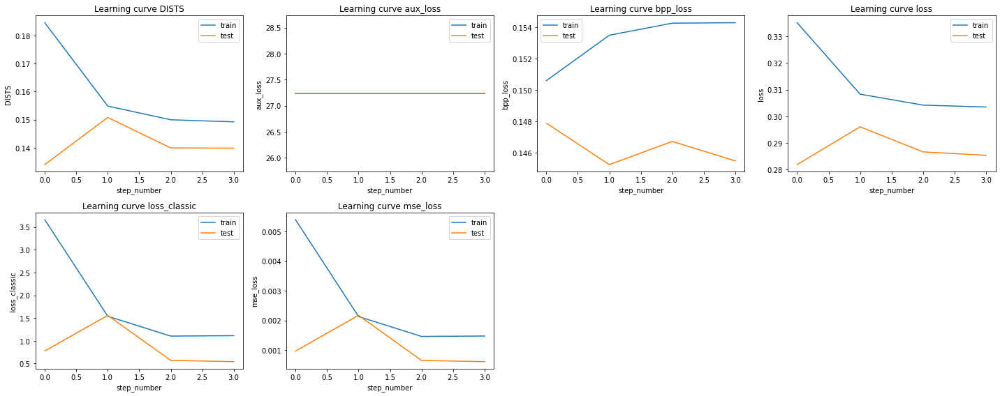

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

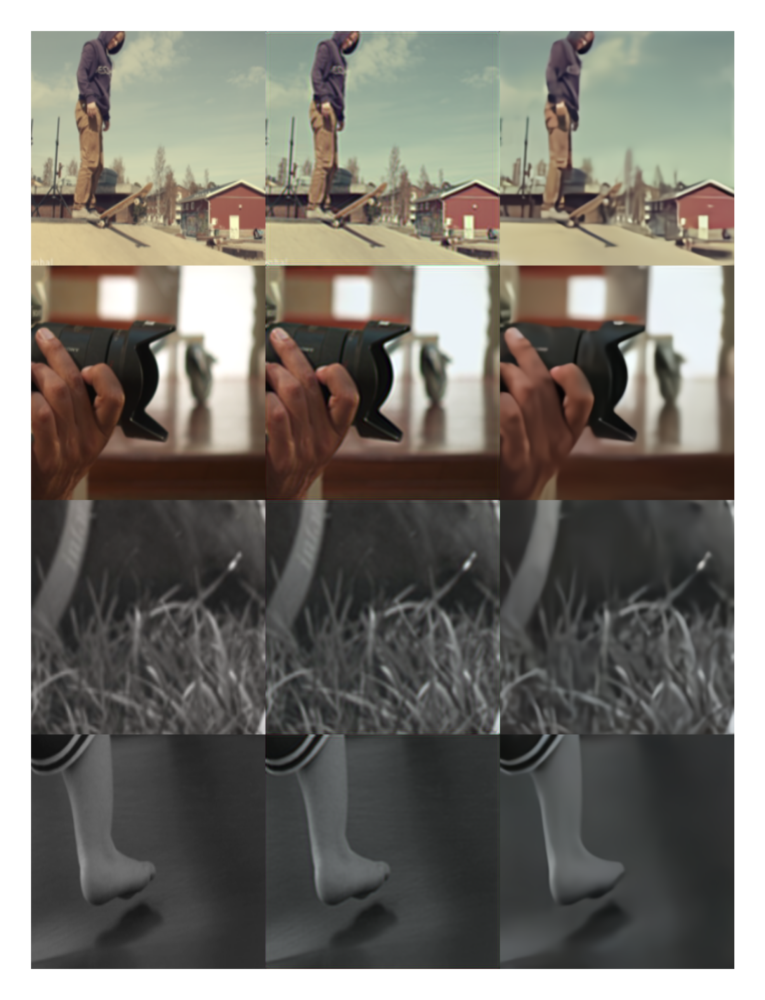

  0%|          | 0/2750 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [7]:
#nn codec
#EXEC

save_filename = "vimeo11k_model_vimeo9k_bpp_DISTS_enhance_cnn_simple2M"


#net_codec = bmshj2018_factorized(quality=2, pretrained=True).train().to(device)
#mbt2018
net_codec = cheng2020_attn(quality=2, pretrained=True).train().to(device)# ssf2020 -- video
dst_dir = "../CVPR_results/dataset_CC_10/"
env = calc_met( model = "MDTVSFA", home_dir1=home_dir,dataset_dir=dst_dir)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
from piq import LPIPS as piq_LPIPS#PieAPP VSI, FSIM, NLPD, deepIQA
from piq import DISTS as piq_DISTS
import IQA_pytorch as iqa#SSIM, GMSD, LPIPSvgg, DISTS
lpips = iqa.LPIPSvgg().to(device)
dists = iqa.DISTS().to(device)

def loss_calc(X_out, Y):
    if X_out['x_hat'].device != Y.device:
        X_out['x_hat'] = X_out['x_hat'].to(device)
    dist = metr.MDTVSFA(X_out['x_hat'])
    loss = rdLoss(X_out, Y)
    loss['MDTVSFA'] = -dist
    lmbda = 1e-2
    loss["loss"] = loss['MDTVSFA'] + loss["bpp_loss"] + lmbda / 2 * loss["mse_loss"] * 255 ** 2# * loss["mse"] + loss["bpp_loss"]
    loss["aux_loss"] = net_codec.aux_loss()
    return loss

class Video_reader_read():
    def __init__(self,name1 = dst_dir + "blue_hair_1920x1080_30.yuv.Y4M"):
        self.nameGT = name1
        
    def get_frame(self):
        self.temp_reader1 = skvideo.io.FFmpegReader(self.nameGT, outputdict={"-c:v" :" rawvideo","-f": "rawvideo"})
        self.datagenGT = [frameGT / 255. for frameGT in self.temp_reader1.nextFrame()]
        self.temp_reader1.close()
        self.datagenGT = np.array([[i[:,:,0],i[:,:,1],i[:,:,2]] for i in self.datagenGT])
        self.lst_1 = torch.tensor(self.datagenGT[0]).float() - 0.5
        return torch.stack([self.lst_1])
rd = Video_reader_read()
def pltimshow(arg):
    plt.imshow(arg.cpu().detach().numpy().swapaxes(1,3).swapaxes(1,2)[0])
class calc_met:
    def __init__(self,dataset1 = ["Run439.Y4M"], convKer1 = None, home_dir1 = "R:/", creat_dir = False, calc_SSIM_PSNR = False, calc_model_features = False, model = "vmaf_v063" , codec = '   -preset:v medium -x265-params log-level=error ',dataset_dir = "dataset/"):
        self.device = "cuda:0"
        self.model = VQAModel().to(device)
        self.model.load_state_dict(torch.load('../models/MDTVSFA.pt'))
        self.model.train()
        self.frame_batch_size = 1
        self.dataset_err = None
        self.dataset_err_torch = None
        self.dataset_np = None
        self.dataset_torch = None
        self.datagen = None
        self.features = None
        self.dataset = []
        self.crf_arr = []
        self.dataset_dir = dataset_dir
        self.calc_model_features = calc_model_features
        self.Results = []
        self.relative_score, self.mapped_score, self.aligned_score = 0,0,0
    def MDTVSFA(self, transformed_video):
        with torch.enable_grad():
            self.features = get_features(transformed_video, frame_batch_size=self.frame_batch_size, device=self.device)
            self.features = torch.unsqueeze(self.features, 0) 
            if len(self.features.shape) == 2:
                self.features = self.features.unsqueeze(0)
            input_length = self.features.shape[1] * torch.ones(1, 1, dtype=torch.long)
            self.relative_score, self.mapped_score, self.aligned_score = self.model.forward([(self.features, input_length, ['K'])])
            y_pred = self.mapped_score[0][0]#.to('cpu').detach().numpy()
        return y_pred
metr = calc_met()

def pltimshow_batch(args, filename = "vis/tmp.png"):
    plt.figure(dpi = 800)
    Ar2 = None
    for arg in args:
        Ar1 = np.concatenate([i for i in arg.cpu().detach().numpy().swapaxes(1,3).swapaxes(1,2)], 0)
        if Ar2 is None:
            Ar2 = Ar1
        else:
            Ar2 = np.concatenate([Ar2,Ar1],1)
    plt.imshow(Ar2)
    plt.axis('off')
    plt.savefig(filename, bbox_inches='tight')
#X_orig = cheng2020_attn(quality=2, pretrained=True)(X.cpu())
class RateDistortionLoss(nn.Module):
    """Custom rate distortion loss with a Lagrangian parameter."""
    def __init__(self, lmbda=1e-2):
        super().__init__()
        self.mse = nn.MSELoss()
        self.lmbda = lmbda

    def forward(self, output, target):
        N, _, H, W = target.size()
        out = {}
        num_pixels = N * H * W

        out["bpp_loss"] = sum(
            (torch.log(likelihoods).sum() / (-math.log(2) * num_pixels))
            for likelihoods in output["likelihoods"].values()
        )
        out["mse_loss"] = self.mse(output["x_hat"], target)
        out["loss_classic"] = self.lmbda * 255 ** 2 * out["mse_loss"] + out["bpp_loss"]
        return out
rdLoss = RateDistortionLoss()
from torch.utils.data import Dataset, IterableDataset
dst_dir_vimeo = 'P:/vimeo_triplet/sequences/'
from torchvision.io import read_image
from torch.utils.data import DataLoader
import os
import torchvision
def dir_of_dirs(paths):
    A = []
    for j in paths:
        for i in os.listdir(j):
            A.append(os.path.join(j, i))
    return A

class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None, target_transform=None,train = True, datalen = 128):
        super(CustomImageDataset).__init__()
        self.datalen = datalen
        self.train = train
        self.image = 0
        self.label = 0
        self.img_names = dir_of_dirs(dir_of_dirs(dir_of_dirs([dst_dir_vimeo])))
        self.img_dir = img_dir
    def __len__(self):
        return self.datalen#9600#len(self.img_names)
    def __getitem__(self, idx):
        if not self.train:
            idx = len(self.img_names) - idx - 1
        img_path = self.img_names[idx]
        image = read_image(img_path)
        if len(image.shape) == 2 or image.shape[0] == 1:
            image = torch.cat([image for i in range(3)])
        self.image = image
        return torchvision.transforms.RandomResizedCrop((256,256))(self.image) / 255.
    
#dataset = CustomImageDataset(dst_dir_vimeo)#219k
#dataset_train = iter(DataLoader(dataset, batch_size= 16, shuffle = True))#13k

#dataset_train, dataset_test = torch.utils.data.random_split( dataset,[int(len(dataset)*0.9),len(dataset)-int(len(dataset)*0.9)])
dataset_train = CustomImageDataset(dst_dir_vimeo,train= True, datalen = 11000)
dataset_test = CustomImageDataset(dst_dir_vimeo,train= False, datalen = 400)
dataset_train = DataLoader(dataset_train, batch_size= 4, shuffle = True)#8
dataset_test = DataLoader(dataset_test, batch_size= 4, shuffle = True)#8
X = rd.get_frame()
X = torchvision.transforms.RandomResizedCrop((256,256))(X)
mse_loss = nn.MSELoss()
#opt_target = [i for i in net_codec.parameters()]
opt_target = [p for n,p in net_codec.named_parameters()]
#optimizer = optim.Adam(opt_target, lr = 0.001)
dr_name = "v_mse"
AV_log = []
curve_mse = []
plot_data = []
plot_data_mse = []
from IPython.display import clear_output

parameters = set(p for n, p in net_enhance.named_parameters()) # set(p for n, p in net_codec.named_parameters() if not n.endswith(".quantiles"))
aux_parameters = set(p for n, p in net_codec.named_parameters() if n.endswith(".quantiles"))
aux_loss = net_codec.entropy_bottleneck.loss()
optimizer = optim.Adam(parameters, lr=1e-4)
aux_optimizer = optim.Adam(aux_parameters, lr=1e-3)
save_netcodec = False

save_result = True
X_sample = torch.load("sample_data/X.ckpt")

n = 30
rd = Video_reader_read()
logs_plot_cur = {}
logs_plot = {}
max_epoch = 12
skip_0epoch = True
for epoch in tqdm(range(max_epoch)):
    if skip_0epoch and epoch == 0:
        continue
    idx_video = 0
    logs_plot_cur = {}
    for to_train in [True, False]:
        tqdm_dataset = tqdm(dataset_train if to_train else dataset_test)
        for frame in tqdm_dataset:
            idx_video += 1
            X.data = frame.data 
            X = torchvision.transforms.RandomResizedCrop((256,256))(X)
            X = X.detach().to(device)
            Y = X.detach().clone().to(device)
            optimizer.zero_grad()
            aux_optimizer.zero_grad()
            X_enhance = net_enhance(X)
            X_out = net_codec.forward(X_enhance)
            loss = rdLoss(X_out, Y)
            lmbda = 1e-2
            #with torch.no_grad():
            #loss['MDTVSFA'] = -metr.MDTVSFA(X_out['x_hat'])
            #loss["LPIPS"] = lpips(X_out['x_hat'], X)
            loss["DISTS"] = dists(X_out['x_hat'], X)
            loss["loss"] =  loss["DISTS"] + loss["bpp_loss"] #+ loss["LPIPS"]
            
            if epoch != 0 and to_train:
                loss["loss"].backward()
                optimizer.step()
            loss["aux_loss"] = net_codec.aux_loss()
            #if epoch != 0 and to_train:
                #loss["aux_loss"].backward()
                #aux_optimizer.step()
                
            torch.nn.utils.clip_grad_norm_(opt_target, 1)
            #optimizer.step()
            
            for j in list(loss.keys()):
                j_converted = j + ("_test" if not to_train else "")
                if not j_converted in logs_plot_cur:
                    logs_plot_cur[j_converted] = []
                logs_plot_cur[j_converted].append(loss[j].data.to("cpu").numpy())
            
            X.data.clamp_(min=0,max=1)
            X_out['x_hat'].data.clamp_(min=0,max=1)
            torch.nn.utils.clip_grad_norm_(opt_target, 1)
            
    if not to_train:
        for j in list(logs_plot_cur.keys()):
            if not j in logs_plot:
                logs_plot[j] = []
            logs_plot[j].append(np.mean(logs_plot_cur[j]))
    if 1:
        clear_output()
        fig = plt.figure(figsize=(20,8))
        unique_names = list(np.unique(list(map(lambda x : x.split("_test")[0], list(logs_plot.keys())))))
        unique_idx = {i: j for i, j in zip(unique_names, range(len(unique_names)))}
        for plot_idx, plot_i in enumerate(list(logs_plot.keys())):
            short_name = plot_i.split("_test")[0]
            cur_idx = unique_idx[short_name]    
            plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
            plt.xlabel("step_number")
            plt.title("Learning curve " + short_name)
            plt.ylabel(short_name)
            plt.plot(np.arange(len(logs_plot[plot_i])), logs_plot[plot_i], label = ("train" if short_name == plot_i else "test"))    
            plt.legend()
            plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
            plt.tight_layout() 
        if save_result == True:
            fig.savefig("vis/lerningcurve" + save_filename + ".png")
            if save_netcodec == True:
                torch.save(net_codec.state_dict(), "models/model_" +save_filename + ".ckpt") 
            if net_enhance != None:
                torch.save(net_enhance.state_dict(), "models_enhancement/model_" +save_filename + ".ckpt") 
            import pickle
            with open('models/plots'+ save_filename + '.pkl', 'wb') as f:
                pickle.dump(logs_plot, f)
    
        tqdm_dataset.refresh()
        plt.show()
        plt.figure(25)
        #X.data = X_sample.data
        #X_out = net_codec.forward(X)
        pltimshow_batch([X,X_enhance, X_out['x_hat']], filename = "vis/pics_" + save_filename + ".png")
        plt.pause(0.005)

In [27]:

def load_models(paths):
    import os
    model_list = []
    for path in paths:
        if os.path.getsize(path) // 10**6 == 73:
            model_list.append(ResNetUNet(3))
        if os.path.getsize(path) // 10**6 == 10:
            model_list.append(get_simple_cnn())
        model_list[-1].load_state_dict(torch.load(path)) 
    return model_list

def MDTVSFA_psnr_bpp_loss(X_out, Y):
    loss = rdLoss(X_out, Y)
    #loss['MDTVSFA'] = -metr.MDTVSFA(X_out['x_hat'])
    #loss["LPIPS"] = lpips(X_out['x_hat'], X)
    #loss["DISTS"] = dists(X_out['x_hat'], X)
    #loss["loss"] =  loss["DISTS"] + loss["bpp_loss"] #+ loss["LPIPS"]
    loss['MDTVSFA'] = -metr.MDTVSFA(X_out['x_hat'])
    loss['PSNR'] = 10 * torch.log10(1. / loss['mse_loss'])
    return loss

def compute_model_codec_dataset(net_enhance, net_codec, dataset, loss_f = MDTVSFA_psnr_bpp_loss):
    logs_plot_cur = {}
    tqdm_dataset = tqdm(dataset)
    for frame in tqdm_dataset:
        X = frame
        X = torchvision.transforms.RandomResizedCrop((256,256))(X)
        X = X.detach().to(device)
        Y = X.detach().clone().to(device)
        X_enhance = net_enhance(X)
        X_out = net_codec.forward(X_enhance)
        loss = loss_f(X_out, Y)
        for j in list(loss.keys()):
            if not j in logs_plot_cur:
                logs_plot_cur[j] = []
            logs_plot_cur[j].append(loss[j].data.to("cpu").numpy())
        X.data.clamp_(min=0,max=1)
        X_out['x_hat'].data.clamp_(min=0,max=1)
    for j in list(logs_plot_cur.keys()):
        logs_plot_cur[j] = np.mean(logs_plot_cur[j])
    return logs_plot_cur

def append_dict(dict_from, dict_to):
    for j in list(dict_from.keys()):
        if not j in dict_to:
            dict_to[j] = []
        dict_to[j].append(np.mean(dict_from[j]))    
    return dict_to
    
def model_codecs_dataset(net_enhance, net_codecs, dataset, loss_f = MDTVSFA_psnr_bpp_loss):
    logs_plot = {}
    for net_codec in net_codecs:
        net_codec_gpu = net_codec.to(device)
        net_enhance_gpu = net_enhance.to(device)
        logs_plot_cur = compute_model_codec_dataset(net_enhance_gpu, net_codec_gpu, dataset, loss_f = MDTVSFA_psnr_bpp_loss)
        logs_plot = append_dict(logs_plot_cur, logs_plot)
        del net_codec_gpu
        del net_enhance_gpu 
    return logs_plot
    
def models_codecs_dataset(net_enhances, net_codecs, dataset, loss_f = MDTVSFA_psnr_bpp_loss):
    logs_plot = []
    for net_enhance in net_enhances:
        logs_plot_cur = model_codecs_dataset(net_enhance, net_codecs, dataset, loss_f = MDTVSFA_psnr_bpp_loss)
        logs_plot.append(logs_plot_cur)
    return logs_plot    

def compare_models(models, net_codec, dataset):
    import os
    log_all = []
    with torch.no_grad():
        logs_plot = {}
        for model in models:
            logs_plot_cur = compute_model_codec_dataset(model, net_codec, dataset)
            for j in list(logs_plot_cur.keys()):
                if not j in logs_plot:
                    logs_plot[j] = []
                logs_plot[j].append(np.mean(logs_plot_cur[j]))
            log_all.append(logs_plot)
    return log_all

In [28]:
test_RDcurves = models_codecs_dataset(load_models(["models_enhancement/model_vimeo11k_original_model.ckpt", 
                                   "models_enhancement/model_vimeo11k_MDTVSFA_2000mse_enhance.ckpt", 
                                   "models_enhancement/model_vimeo11k_MDTVSFA_2000mse_enhance_no_codec.ckpt",
                                   "models_enhancement/model_vimeo11k_MDTVSFA_2000mse_enhance_quality5.ckpt"]), [cheng2020_attn(quality=1 + i, pretrained=True).eval() for i in range(6)], dataset_test, loss_f = MDTVSFA_psnr_bpp_loss)
test_RDcurves

Downloading: "https://compressai.s3.amazonaws.com/models/v1/cheng2020_attn-mse-1-465f2b64.pth.tar" to C:\Users\MaxV/.cache\torch\hub\checkpoints\cheng2020_attn-mse-1-465f2b64.pth.tar


  0%|          | 0.00/54.3M [00:00<?, ?B/s]

Downloading: "https://compressai.s3.amazonaws.com/models/v1/cheng2020_attn-mse-4-f7b0ccf2.pth.tar" to C:\Users\MaxV/.cache\torch\hub\checkpoints\cheng2020_attn-mse-4-f7b0ccf2.pth.tar


  0%|          | 0.00/121M [00:00<?, ?B/s]

Downloading: "https://compressai.s3.amazonaws.com/models/v1/cheng2020_attn-mse-6-730501f2.pth.tar" to C:\Users\MaxV/.cache\torch\hub\checkpoints\cheng2020_attn-mse-6-730501f2.pth.tar


  0%|          | 0.00/121M [00:00<?, ?B/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

[{'bpp_loss': [0.053283706,
   0.045385327,
   0.08408048,
   0.063756734,
   0.058424782,
   0.30000064],
  'mse_loss': [0.17005473,
   0.16412972,
   0.16408768,
   0.16793457,
   0.16823757,
   0.17433123],
  'loss_classic': [110.631386,
   106.77073,
   106.78209,
   109.263214,
   109.4549,
   113.65889],
  'MDTVSFA': [-0.4534301,
   -0.45124936,
   -0.4502846,
   -0.46358562,
   -0.45815387,
   -0.45743957],
  'PSNR': [7.9112935, 8.151906, 8.120291, 8.014034, 7.975579, 7.8164124]},
 {'bpp_loss': [0.0532654,
   0.07954487,
   0.11626127,
   0.1692086,
   0.22265413,
   0.31874764],
  'mse_loss': [0.00029595752,
   0.00021577967,
   0.00016346552,
   0.00014409852,
   0.00013400514,
   0.0001366617],
  'loss_classic': [0.24571174,
   0.21985558,
   0.22255474,
   0.26290864,
   0.30979097,
   0.40761197],
  'MDTVSFA': [-0.47990865,
   -0.5226941,
   -0.53684646,
   -0.5573643,
   -0.55687255,
   -0.5630593],
  'PSNR': [35.592945, 36.929554, 38.163418, 38.55698, 38.815487, 38.74144]

In [32]:
32

32

In [29]:
test_RDcurves

[{'bpp_loss': [0.053283706,
   0.045385327,
   0.08408048,
   0.063756734,
   0.058424782,
   0.30000064],
  'mse_loss': [0.17005473,
   0.16412972,
   0.16408768,
   0.16793457,
   0.16823757,
   0.17433123],
  'loss_classic': [110.631386,
   106.77073,
   106.78209,
   109.263214,
   109.4549,
   113.65889],
  'MDTVSFA': [-0.4534301,
   -0.45124936,
   -0.4502846,
   -0.46358562,
   -0.45815387,
   -0.45743957],
  'PSNR': [7.9112935, 8.151906, 8.120291, 8.014034, 7.975579, 7.8164124]},
 {'bpp_loss': [0.0532654,
   0.07954487,
   0.11626127,
   0.1692086,
   0.22265413,
   0.31874764],
  'mse_loss': [0.00029595752,
   0.00021577967,
   0.00016346552,
   0.00014409852,
   0.00013400514,
   0.0001366617],
  'loss_classic': [0.24571174,
   0.21985558,
   0.22255474,
   0.26290864,
   0.30979097,
   0.40761197],
  'MDTVSFA': [-0.47990865,
   -0.5226941,
   -0.53684646,
   -0.5573643,
   -0.55687255,
   -0.5630593],
  'PSNR': [35.592945, 36.929554, 38.163418, 38.55698, 38.815487, 38.74144]

In [30]:
train_RDcurves = models_codecs_dataset(load_models(["models_enhancement/model_vimeo11k_original_model.ckpt", 
                                   "models_enhancement/model_vimeo11k_MDTVSFA_2000mse_enhance.ckpt", 
                                   "models_enhancement/model_vimeo11k_MDTVSFA_2000mse_enhance_no_codec.ckpt",
                                   "models_enhancement/model_vimeo11k_MDTVSFA_2000mse_enhance_quality5.ckpt"]), [cheng2020_attn(quality=1 + i, pretrained=True).eval() for i in range(6)], dataset_train, loss_f = MDTVSFA_psnr_bpp_loss)
train_RDcurves

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  0%|          | 0/2750 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [35]:
len(train_RDcurvesain_RDcurves)

4

In [34]:
train_RDcurves

[{'bpp_loss': [0.049163073,
   0.044195436,
   0.08203535,
   0.06397402,
   0.05905388,
   0.29974446],
  'mse_loss': [0.20917673,
   0.20771004,
   0.21047533,
   0.20914485,
   0.20744511,
   0.21679568],
  'loss_classic': [136.06633,
   135.10767,
   136.94362,
   136.06041,
   134.95023,
   141.27113],
  'MDTVSFA': [-0.45324335,
   -0.45122096,
   -0.45030344,
   -0.46338886,
   -0.45814738,
   -0.45712712],
  'PSNR': [7.1191306, 7.1576924, 7.0900683, 7.1140547, 7.170601, 6.9356804]},
 {'bpp_loss': [0.06311762,
   0.09020506,
   0.13302171,
   0.19909228,
   0.26970476,
   0.371055],
  'mse_loss': [0.0003828995,
   0.0002670833,
   0.00020315651,
   0.00017813264,
   0.00016778753,
   0.00016124349],
  'loss_classic': [0.312098,
   0.263876,
   0.26512423,
   0.31492305,
   0.3788086,
   0.4759036],
  'MDTVSFA': [-0.49183837,
   -0.5316614,
   -0.55050814,
   -0.5600437,
   -0.56349325,
   -0.56572497],
  'PSNR': [34.558243, 36.079647, 37.22513, 37.700294, 37.902596, 38.054]},
 {'

In [16]:
logs_plot

{'bpp_loss': [0.15060389, 0.15349767, 0.15426429, 0.15429342],
 'mse_loss': [0.005398823, 0.0021298656, 0.001457751, 0.0014720722],
 'loss_classic': [3.6611881, 1.5384426, 1.1021669, 1.1115084],
 'DISTS': [0.18454829, 0.15481272, 0.14992912, 0.14919277],
 'loss': [0.33515218, 0.3083104, 0.3041934, 0.30348617],
 'aux_loss': [27.23124, 27.23124, 27.23124, 27.23124],
 'bpp_loss_test': [0.14790304, 0.14526181, 0.14673911, 0.14549986],
 'mse_loss_test': [0.00096509367, 0.0021710424, 0.0006469883, 0.00060693524],
 'loss_classic_test': [0.7754552, 1.5569823, 0.56744325, 0.54015946],
 'DISTS_test': [0.13393578, 0.15077142, 0.13988358, 0.13982187],
 'loss_test': [0.2818388, 0.29603323, 0.28662267, 0.2853217],
 'aux_loss_test': [27.23124, 27.23124, 27.23124, 27.23124]}

In [35]:
def compare_model_logs(model_log_paths):
    plots_all = []
    for path in model_log_paths:
        with open(path, 'rb') as f:
            plots_all.append(pickle.load(f))
    RD_curve = []
    Data_1 = {}
    for plot in plots_all:
        for key in plot.keys():
            if not (key in Data_1):
                Data_1[key] = []
            Data_1[key].append(plot[key][-1])
    return Data_1

In [36]:
compare_model_logs(["models/plotsvimeo11k_model_vimeo9k_bpp_DISTS_enhance_cnn_simple2M.pkl", 
                    "models/plotsvimeo11k_model_vimeo9k_DISTS_enhance.pkl",
                   "models/plotsvimeo11k_model_vimeo9k_DISTS_MDTVSFA_LPIPS_enhance.pkl"])

{'bpp_loss': [0.15429342, 0.15357186, 0.17250063],
 'mse_loss': [0.0014720722, 0.0005990791, 0.0024296308],
 'loss_classic': [1.1115084, 0.54312307, 1.7523679],
 'DISTS': [0.14919277, 0.115232676, 0.14045574],
 'loss': [0.30348617, 0.26880452, -0.11911303],
 'aux_loss': [27.23124, 27.23124, 27.23124],
 'bpp_loss_test': [0.14549986, 0.14658152, 0.16310762],
 'mse_loss_test': [0.00060693524, 0.0004037853, 0.0028363967],
 'loss_classic_test': [0.54015946, 0.40914285, 2.0074742],
 'DISTS_test': [0.13982187, 0.11070264, 0.14138897],
 'loss_test': [0.2853217, 0.25728413, -0.16857834],
 'aux_loss_test': [27.23124, 27.23124, 27.23124],
 'MDTVSFA': [-0.621173],
 'LPIPS': [0.18910365],
 'MDTVSFA_test': [-0.6595494],
 'LPIPS_test': [0.18647447]}

In [ ]:
Simple_CNN DISTS 10Mb bpp_train 0.1535, DISTS_train 0.1491, bpp_loss_test 0.1454, DISTS_test 0.13982, mse_test 0.0006, mse_train 0.00147
DISTS_ResUnet    75Mb bpp_train 0.154, DISTS_train 0.11523, bpp_loss_test 0.1465, DISTS_test 0.1107, mse_test 0.0004, mse_train 0.000599

In [17]:
from useful_tools import count_parameters

In [18]:
X = frame.to(device)
X_enhance = net_enhance(X)
X_out = net_codec.forward(X)

In [22]:
a = dists.cpu()(X_out['x_hat'].cpu(),X.cpu())
b = dists(X_enhance.cpu(),X.cpu())
c = dists(X.cpu(),X_enhance.cpu())
d = dists(X_out['x_hat'].cpu(),X_enhance.cpu())
print(a.cpu(),b.cpu(), c.cpu(),d.cpu())

tensor(0.1692, grad_fn=<MeanBackward0>) tensor(0.1706, grad_fn=<MeanBackward0>) tensor(0.1706, grad_fn=<MeanBackward0>) tensor(0.2619, grad_fn=<MeanBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


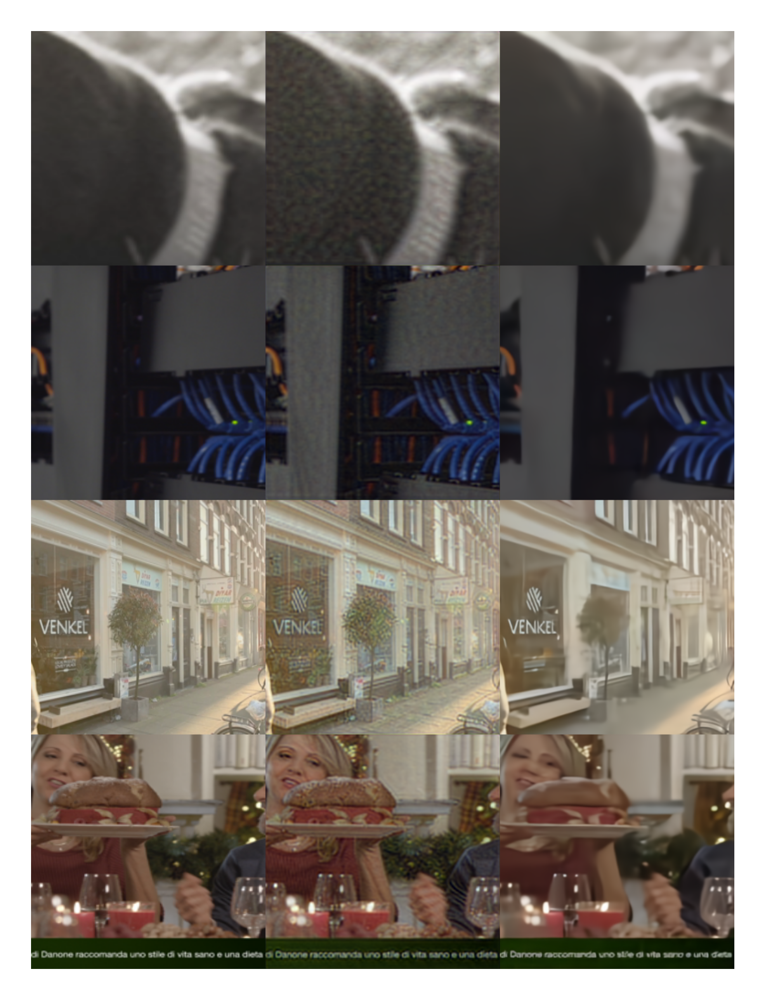

In [19]:
pltimshow_batch([X, X_enhance, X_out['x_hat']])

In [70]:
#losses
from piq import GMSDLoss, PieAPP, VSILoss, FSIMLoss, HaarPSILoss
from IQA_pytorch import NLPD
v = HaarPSILoss().cpu()(X.cpu(),X.cpu())
v = FSIMLoss().cpu()(X.cpu(),X.cpu())
v = NLPD().cpu()(X.cpu(),X.cpu())
v = VSILoss().cpu()(X.cpu(),X.cpu())
v = GMSDLoss().cpu()(X.cpu(),X.cpu())
v = PieAPP(enable_grad = True).cpu()(X.cpu(),X.cpu())

In [76]:
X_enchch.shape

torch.Size([8, 3, 256, 256])

In [78]:
X.shape

torch.Size([8, 3, 256, 256])

<ipython-input-10-ed2d8e2c9617>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-10-ed2d8e2c9617>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
<ipython-input-10-ed2d8e2c9617>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently re

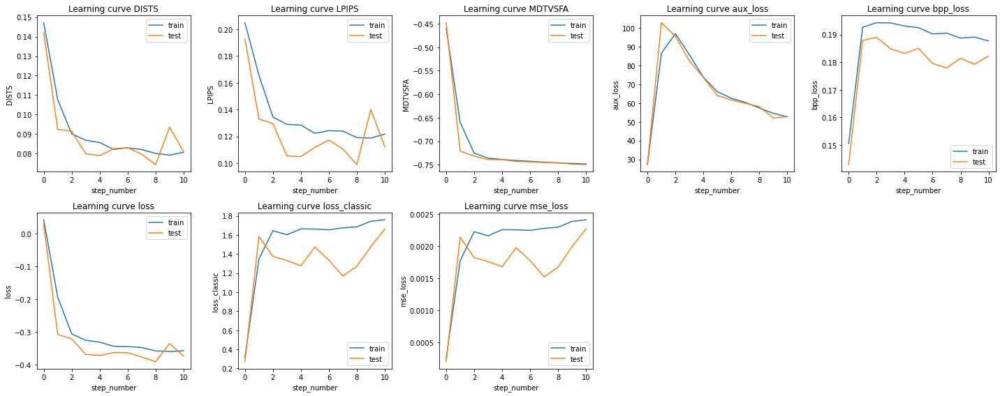

In [10]:
fig = plt.figure(figsize=(20,8))
save_result = True
for plot_idx, plot_i in enumerate(list(logs_plot.keys())):

    short_name = plot_i.split("_test")[0]
    cur_idx = unique_idx[short_name]    
    plt.subplot(2, math.ceil( (len(unique_idx)+1) / 2), cur_idx + 1, )
    plt.xlabel("step_number")
    plt.title("Learning curve " + short_name)
    plt.ylabel(short_name)
    plt.plot(np.arange(len(logs_plot[plot_i])), logs_plot[plot_i], label = ("train" if short_name == plot_i else "test"))    
    plt.legend()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.tight_layout() 
if save_result == True:
    fig.savefig("vis/lerningcurve" + save_filename + ".png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


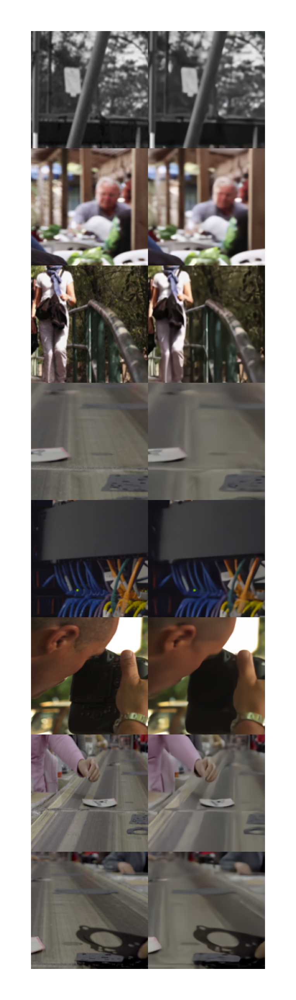

In [9]:
X_sample = torch.load("sample_data/X.ckpt")
save_filename = "original_cheng2020_attn_q2"
net_codec.load_state_dict(torch.load("models/model_" + save_filename + ".ckpt"))
pltimshow_batch([X.cpu(), net_codec.cpu()(X.cpu())['x_hat']],filename = "vis/pics_" + save_filename + ".png")